In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sympy as sp
from utils import round_expr, symdisp, symplot, genConvGIF, genGIF
from sympy import oo as inf

from sympy.polys.partfrac import apart

# temp workaround
import warnings
from matplotlib import MatplotlibDeprecationWarning
warnings.filterwarnings('ignore', category=MatplotlibDeprecationWarning)

plt.rcParams['figure.figsize'] = 6, 4
plt.rcParams['legend.fontsize'] = 13
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['axes.grid'] = False

In [2]:
from IPython.core.display import HTML
from IPython.display import Image
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

# *Circuitos Elétricos I - Semana 12*

### A integral de convolução

Seja $x(t)$ uma função real definida no intervalo $0\leq t \leq \infty$, $h(t)$ a resposta o impulso de um sistema causal e $y(t)$ a saída do sistema quando $x(t)$ é aplicado na entrada, essas funções estão relacionadas pela integral de convolução

$$\large
\begin{aligned}
y(t) &= h(t)\ast x(t) \\
     &=\int_{-\infty}^{\infty} x(\tau) h(t-\tau) d\tau\\
     &=\int_{-\infty}^{\infty} h(\tau) x(t-\tau) d\tau
\end{aligned}
$$

In [3]:
# transformada de Laplace
def L(f,t,s):
    return sp.laplace_transform(f, t, s, noconds=True)

# transformada inversa de Laplace
def invL(F,s,t):
    return sp.re(sp.inverse_laplace_transform(F, s, t, noconds=True))

# funções para auxílio na expansão em frações parciais
def adjustCoeff(expr):    
    coeff = expr.as_numer_denom()
    c0 = sp.poly(coeff[1].cancel()).coeffs()[0]
    
    return (coeff[0].cancel()/c0)/(coeff[1].cancel()/c0)

def partFrac(expr, Ndigits):
    expr = expr.cancel()
    expr = apart(adjustCoeff(expr), s, full=True).doit()
    
    return sp.N(expr, Ndigits)

sp.init_printing()

def espelhaDesloca(g, t, d):    
    return g.subs({t:-t+d})

#### Definindo algumas variáveis simbólicas de interesse

In [4]:
s  = sp.symbols('s')
a, R, C  = sp.symbols('a, R, C', real=True, positive=True)
t, τ, omega = sp.symbols('t, τ, omega', real=True)

In [5]:
generateGIFs = False

## Exemplos de cálculo da convolução utilizando o sympy


### Exemplo 1: convolução de dois pulsos retangulares

In [6]:
x = sp.Piecewise((0, t<0), 
                  (1, (t>=0)&(t<2)), 
                  (0, (t>=2)))

symdisp('x(t) = ', round_expr(x,2))

<IPython.core.display.Math object>

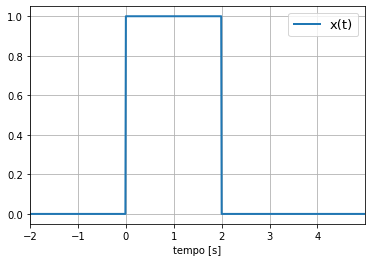

In [7]:
# plota função no domínio do tempo
intervalo = np.arange(-2, 5, 0.01)
symplot(t, x, intervalo, 'x(t)')

**1º Intervalo:** $t<0$ s

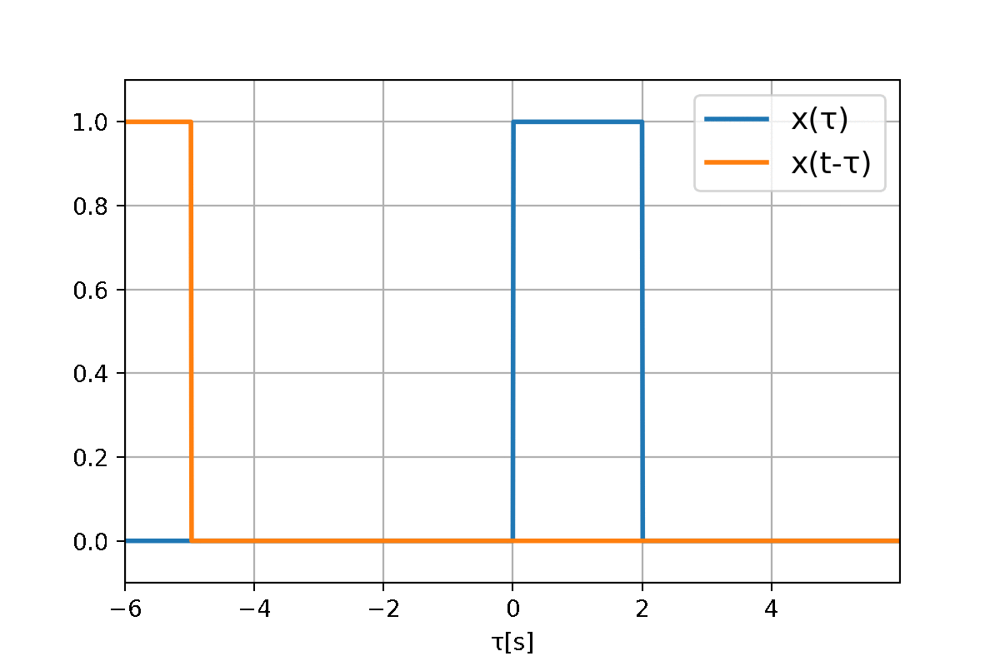

In [8]:
if generateGIFs:
    ti = -5
    tf = 0

    atraso = np.arange(-6, 6, 0.01)    
    figName  = './figures/conv1-int1.gif'
    genConvGIF(x, x, t, atraso, ti, tf, figName, xlabel= 'τ[s]', ylabel=['x(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv1-int1.gif', width=500)

**2º Intervalo:** $0\leq t < 2$ s

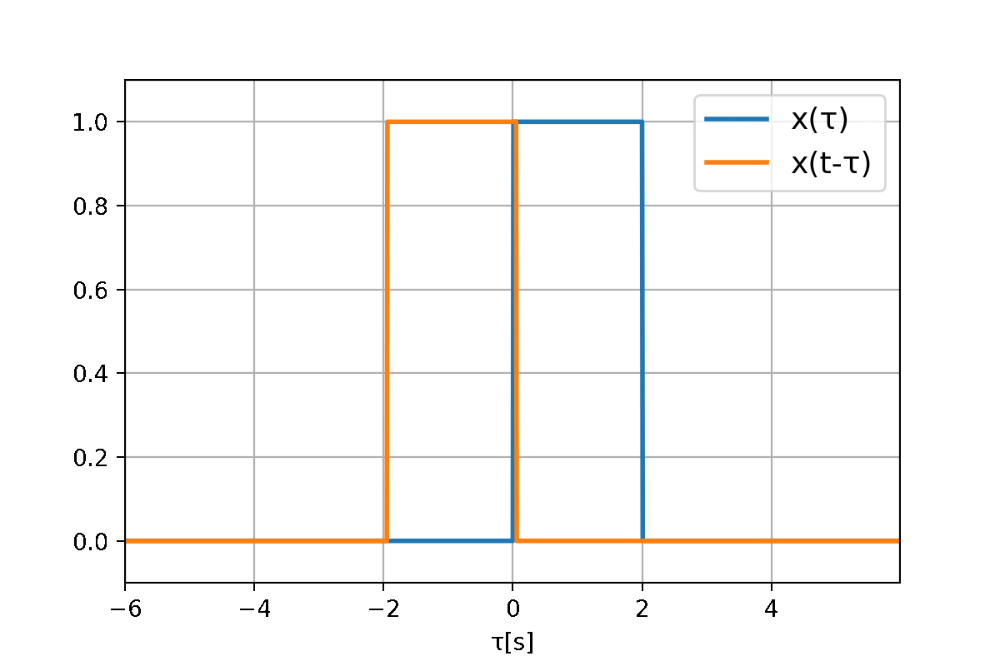

In [9]:
if generateGIFs:
    ti = 0
    tf = 2
    
    atraso = np.arange(-6, 6, 0.01)    
    figName  = './figures/conv1-int2.gif'
    genConvGIF(x, x, t, atraso, ti, tf, figName, xlabel= 'τ[s]', ylabel=['x(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv1-int2.gif', width=500)

**3º Intervalo:** $2 \leq t <4$ s

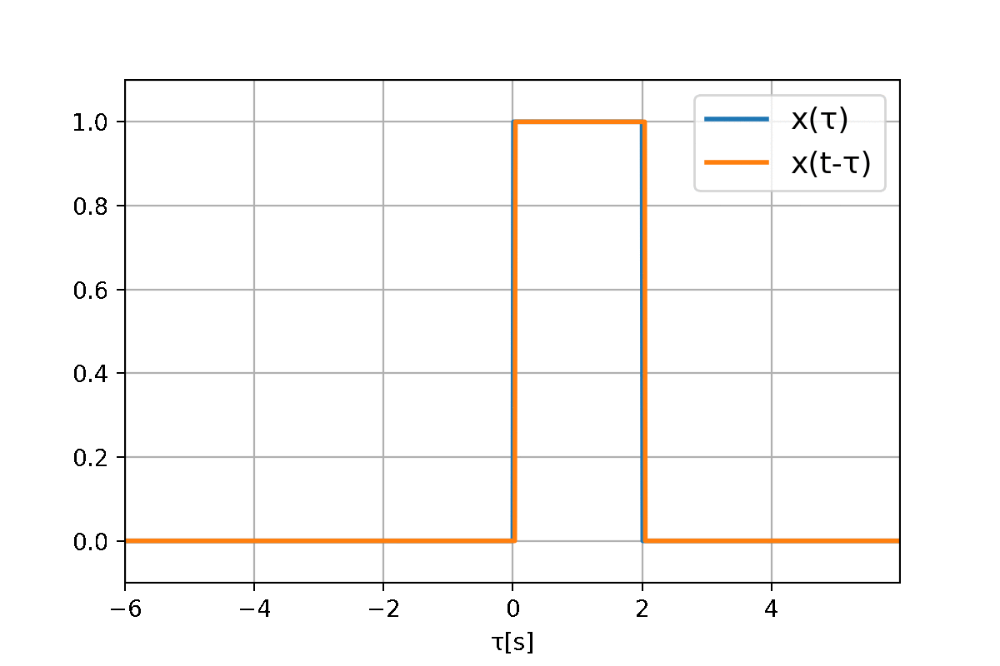

In [10]:
if generateGIFs:
    ti = 2
    tf = 4

    atraso = np.arange(-6, 6, 0.01)    
    figName  = './figures/conv1-int3.gif'
    genConvGIF(x, x, t, atraso, ti, tf, figName, xlabel= 'τ[s]', ylabel=['x(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv1-int3.gif', width=500)

**4º Intervalo:** $t \geq 4$ s

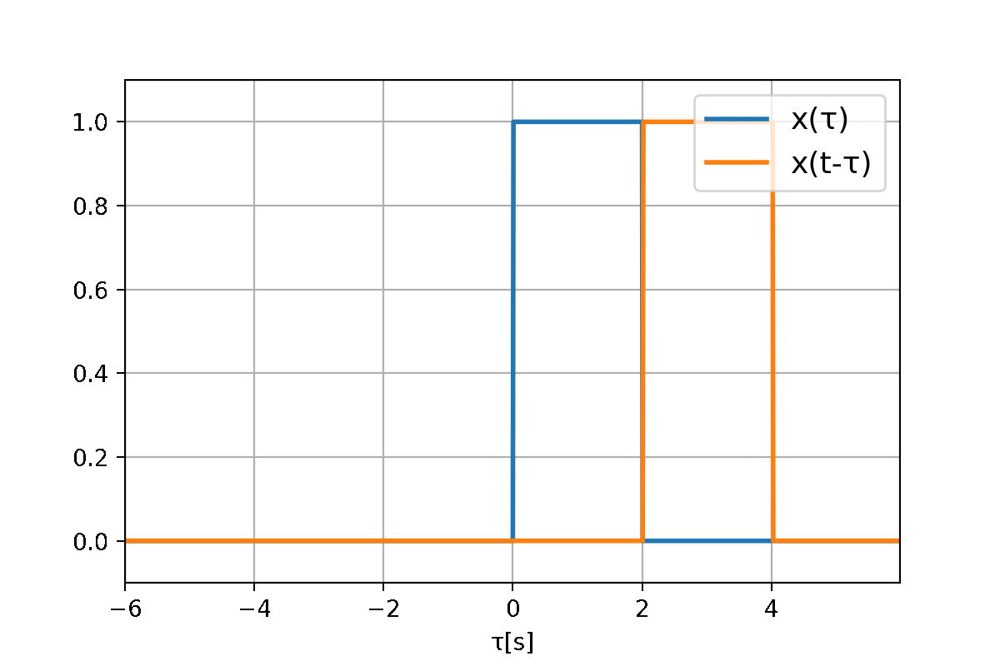

In [11]:
if generateGIFs:
    ti = 4
    tf = 8

    atraso = np.arange(-6, 6, 0.01)    
    figName  = './figures/conv1-int4.gif'
    genConvGIF(x, x, t, atraso, ti, tf, figName, xlabel= 'τ[s]', ylabel=['x(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv1-int4.gif', width=500)

In [12]:
y1 = 0 # 1º intervalo

y2 = sp.integrate(1, (τ, 0, t)) # 2º intervalo

y3 = sp.integrate(1, (τ, t-2, 2)) # 3º intervalo

y4 = 0 # 4º intervalo

y = sp.Piecewise((y1, t<0),
                 (y2, (t>=0)&(t<2)), 
                 (y3, (t>=2)&(t<4)),
                 (y4, (t>=4)))

symdisp('y(t) = ', y)

<IPython.core.display.Math object>

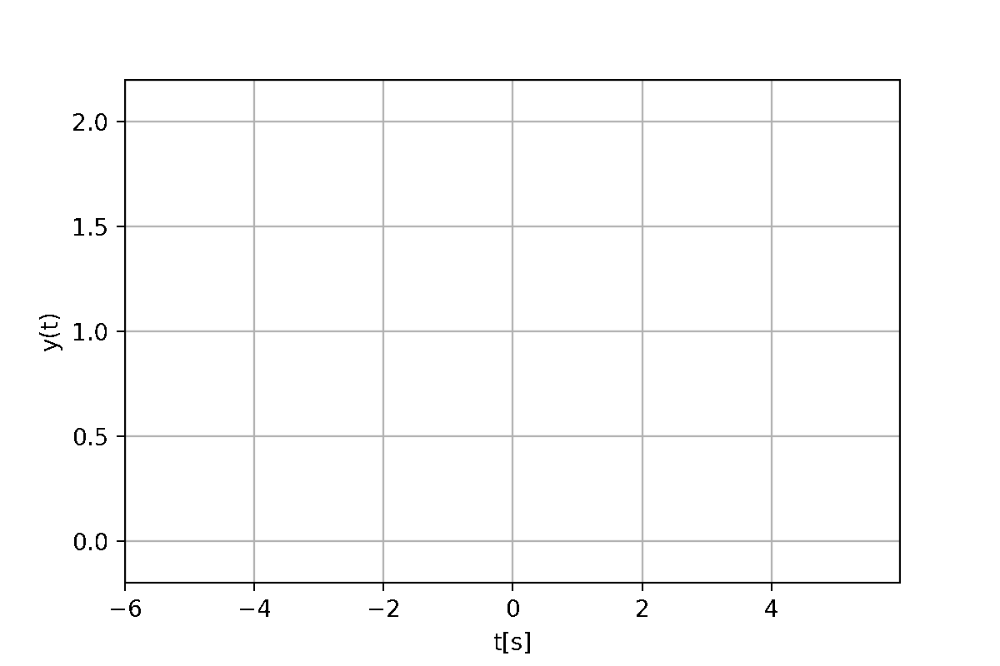

In [14]:
# plota função no domínio do tempo
if generateGIFs:
    intervalo = np.arange(-6, 6, 0.01)

    y_fun = sp.lambdify(t, y, 'numpy')
    y_num = y_fun(intervalo)
    
    figName = './figures/fullConv1.gif'
    genGIF(intervalo, y_num, figName, xlabel='t[s]', ylabel='y(t)', fram=200, inter=80)

Image('./figures/fullConv1.gif', width=500)

### Exemplo 2: resposta de um circuito RC a uma sequência de pulsos de tensão

In [13]:
R, C  = sp.symbols('R, C', real=True, positive=True)

τRC = R*C

In [14]:
x = sp.Piecewise((0, t<0), 
                  (1, (t>=0)&(t<2)), 
                  (-1, (t>=2)&(t<3)),
                  (0, (t>=3)))


symdisp('x(t) = ', round_expr(x,2))

<IPython.core.display.Math object>

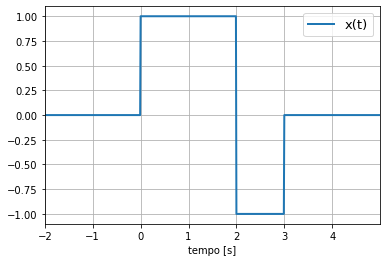

In [15]:
# plota função no domínio do tempo
intervalo = np.arange(-2, 5, 0.01)
symplot(t, x, intervalo, 'x(t)')

<IPython.core.display.Math object>

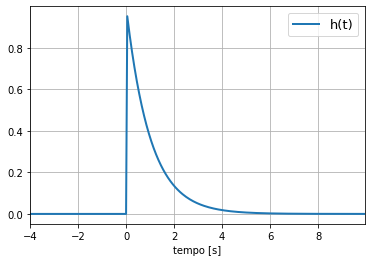

In [16]:
h = (1/τRC)*sp.exp(-t/τRC) # resposta ao impulso de um circuito RC

h = sp.Piecewise((0,t<0),(h, t>=0))

symdisp('h(t) = ', h)

# plota função no domínio do tempo
intervalo = np.arange(-4, 10, 0.05)
symplot(t, h.subs({R:1, C:1}), intervalo, 'h(t)')

**1º Intervalo:** $t < 0$ s

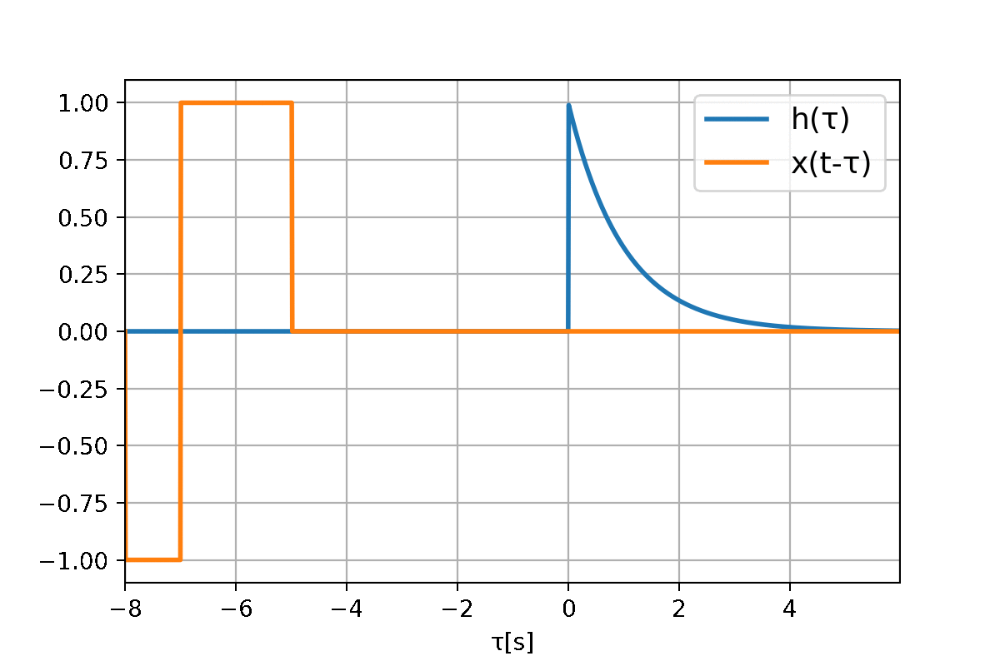

In [17]:
if generateGIFs:
    ti = -5
    tf = 0

    atraso = np.arange(-8, 6, 0.01)    
    figName  = './figures/conv2-int1.gif'
    genConvGIF(x, h.subs({R:1, C:1}), t, atraso, ti, tf, figName,\
               xlabel= 'τ[s]', ylabel=['h(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv2-int1.gif', width=500)

**2º Intervalo:** $0 \leq t < 2$ s

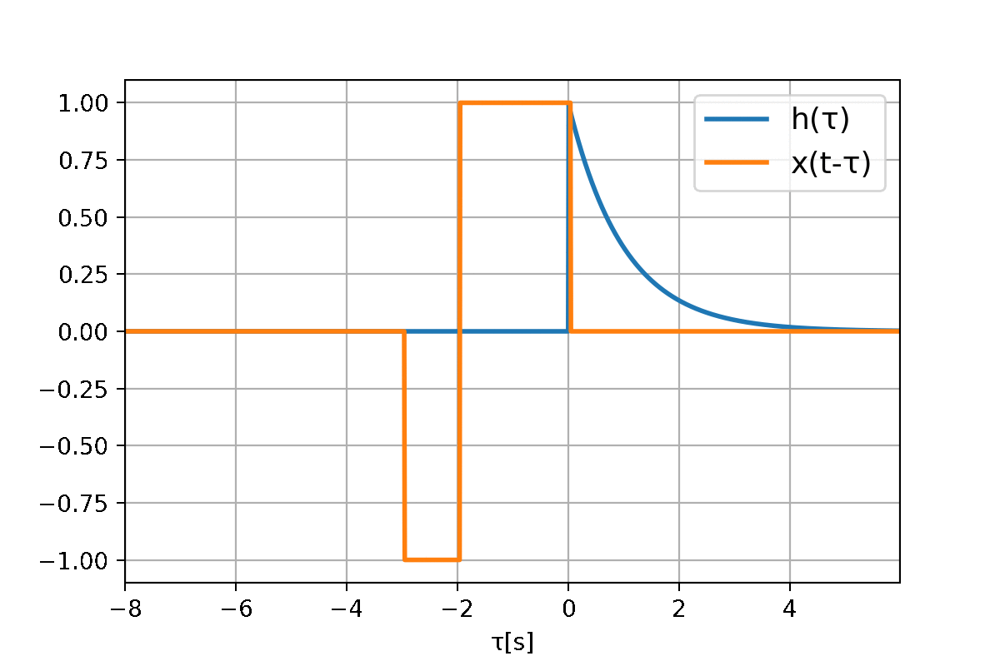

In [18]:
if generateGIFs:
    ti = 0
    tf = 2

    atraso = np.arange(-8, 6, 0.01)    
    figName  = './figures/conv2-int2.gif'
    genConvGIF(x, h.subs({R:1, C:1}), t, atraso, ti, tf, figName,\
               xlabel= 'τ[s]', ylabel=['h(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv2-int2.gif', width=500)

**3º Intervalo:** $2\leq t < 3$ s

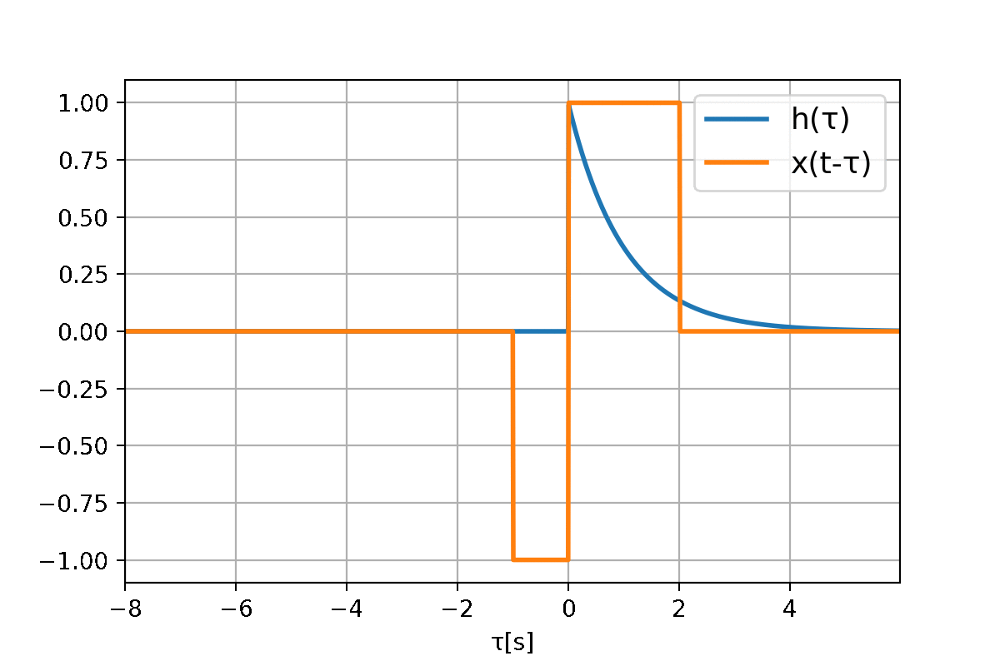

In [19]:
if generateGIFs:
    ti = 2
    tf = 3

    atraso = np.arange(-8, 6, 0.01)    
    figName  = './figures/conv2-int3.gif'
    genConvGIF(x, h.subs({R:1, C:1}), t, atraso, ti, tf, figName,\
               xlabel= 'τ[s]', ylabel=['h(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv2-int3.gif', width=500)

**4º Intervalo:** $t \geq 3$ s

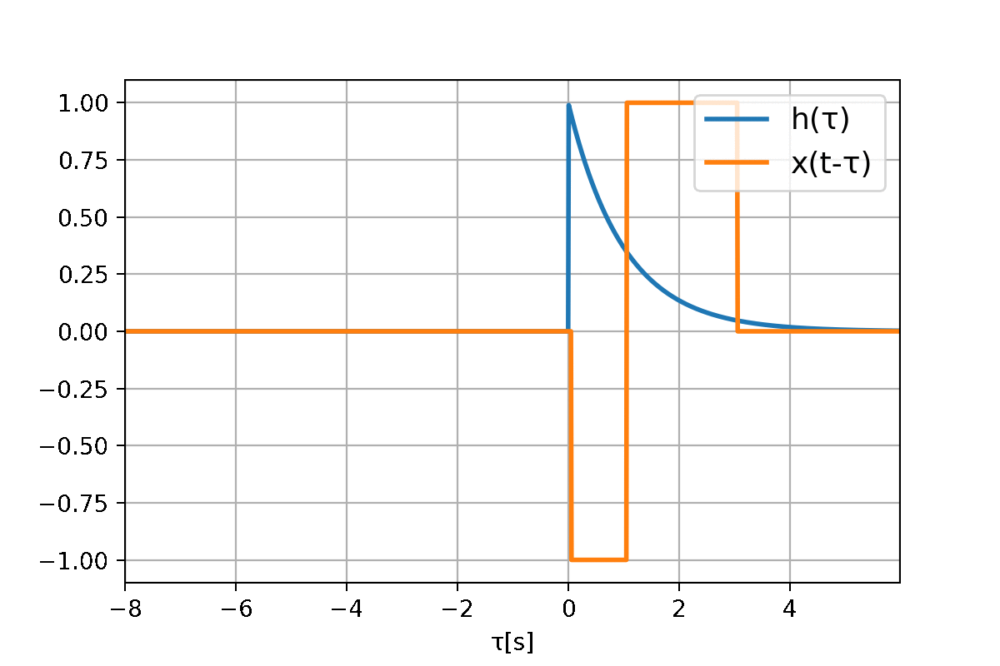

In [20]:
if generateGIFs:
    ti = 3
    tf = 6

    atraso = np.arange(-8, 6, 0.01)    
    figName  = './figures/conv2-int4.gif'
    genConvGIF(x, h.subs({R:1, C:1}), t, atraso, ti, tf, figName,\
               xlabel= 'τ[s]', ylabel=['h(τ)', 'x(t-τ)'], fram=200, inter=80)

Image('./figures/conv2-int4.gif', width=500)

In [23]:
x_tau = espelhaDesloca(x, t, τ)
h_tau = h.subs({t:τ})

symdisp('h(τ) = ', h_tau)
symdisp('x(t-τ) = ', round_expr(x_tau,2))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

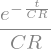

In [24]:
h.args[1][0]

In [25]:
h_tau = (h.args[1][0]).subs({t:τ})

y1 = 0 # 1º intervalo: t < 0

print('Para t<0:')
symdisp('y(t)= ', y1)

y2 = sp.integrate(1*h_tau, (τ, 0, t)) # 2º intervalo: t >= 0 e t < 2

print('Para t>=0 e t<2:')
symdisp('y(t)= ', y2)

y3 = sp.integrate(1*h_tau, (τ, t-2, t)) + sp.integrate(-1*h_tau, (τ, 0, t-2)) # 3º intervalo: t >= 2 e t < 3

print('Para t>=2 e t<3:')
symdisp('y(t)= ', round_expr(y3,2))

y4 = sp.integrate(1*h_tau, (τ, t-2, t)) + sp.integrate(-1*h_tau, (τ, t-3, t-2)) # 4º intervalo: t >= 3 

print('Para t>=3:')
symdisp('y(t)= ', round_expr(y4,2))

Para t<0:


<IPython.core.display.Math object>

Para t>=0 e t<2:


<IPython.core.display.Math object>

Para t>=2 e t<3:


<IPython.core.display.Math object>

Para t>=3:


<IPython.core.display.Math object>

In [26]:
y = sp.Piecewise((y1, t<0),
                 (y2, (t>=0)&(t<2)), 
                 (y3, (t>=2)&(t<3)),
                 (y4, (t>=3)))

symdisp('y(t) = ', round_expr(y,2))

<IPython.core.display.Math object>

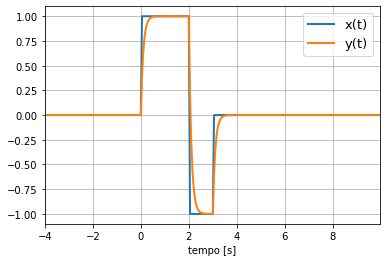

In [27]:
C_circ = 100e-6
R_circ = 1e3

intervalo = np.arange(-4, 10, 0.05)

# plota resposta ao impulso 
symplot(t, h.subs({R:R_circ,C:C_circ}), intervalo, 'h(t)')

# plota função no domínio do tempo
symplot(t, [x, y.subs({R:R_circ,C:C_circ})], intervalo, ['x(t)', 'y(t)'])